# Libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# pywsd: using lemmatize_sentence
# emot: working with emojis and emoticons
# lime: lime
# shap: shap
# !pip install -r requirements.txt
!pip install -q pywsd emot lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.6/31.6 MB 58.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 30.2 MB/s eta 0:00:00


In [3]:
# imports
import math
import pandas as pd
import numpy as np
import scipy as sp
import random
import os
import re
import json
from itertools import product
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 500)

# plots
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
plt.style.use('ggplot')

# text preprocessing
import re
import nltk
import emot
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from emot.emo_unicode import UNICODE_EMOJI, EMOTICONS_EMO
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')
from pywsd.utils import lemmatize_sentence

# feature extraction / vectorization
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler

# Model Building
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score

# evaluation & storing models
import pickle
import joblib
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification, TrainingArguments, Trainer

from lime.lime_text import LimeTextExplainer
import shap

# word2vec + lstm pytorch
import gensim.downloader as api
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

import lime
from lime import lime_text
from sklearn.pipeline import make_pipeline

from collections import defaultdict

from itertools import chain

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
Warming up PyWSD (takes ~10 secs)... took 5.374738693237305 secs.


In [4]:
DATA_DIR = '/content/drive/MyDrive/sa-yen/data/'
MODEL_DIR = '/content/drive/MyDrive/sa-yen/models/'
IMAGE_DIR = '/content/drive/MyDrive/sa-yen/images/'

# DATA_DIR = 'data/'
# MODEL_DIR = 'models/'
# IMAGE_DIR = 'images/'

# Function to load data

In [5]:
def get_data(sample=None):
    train_df = pd.read_csv(DATA_DIR + 'train_processed.csv')
    dev_df = pd.read_csv(DATA_DIR + 'dev_processed.csv')
    test_df = pd.read_csv(DATA_DIR + 'test_processed.csv')
    industrial_df = pd.read_csv(DATA_DIR + 'industrial_data_processed.csv')

    if sample:
        train_df = train_df.sample(sample[0])
        dev_df = dev_df.sample(sample[1])
        test_df = test_df.sample(sample[2])

    train_df.dropna(inplace=True)
    dev_df.dropna(inplace=True)
    test_df.dropna(inplace=True)

    X_train = train_df.processedReviewText.values
    y_train = train_df.overall.values

    X_dev = dev_df.processedReviewText.values
    y_dev = dev_df.overall.values

    X_test = test_df.processedReviewText.values
    y_test = test_df.overall.values

    X_data = np.concatenate((X_train, X_dev, X_test))
    y_data = np.concatenate((y_train, y_dev, y_test))

    return X_train, y_train, X_dev, y_dev, X_test, y_test, X_data, y_data, industrial_df

# Model Wrappers

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class LSTMModel(nn.Module):
    def __init__(self, embedding_dim, embedding_matrix, num_classes=3, hidden_size=[64, 128], activation='relu'):

        super(LSTMModel, self).__init__()

        self.embedding = nn.Embedding.from_pretrained(torch.FloatTensor(embedding_matrix), freeze=True)  # Freeze embeddings

        self.lstm1 = nn.LSTM(embedding_dim, hidden_size[0], batch_first=True)
        self.dropout1 = nn.Dropout(0.5)
        self.lstm2 = nn.LSTM(hidden_size[0], hidden_size[1], batch_first=True)
        self.dropout2 = nn.Dropout(0.5)

        self.fc1 = nn.Linear(hidden_size[1], 64)
        self.dropout3 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, num_classes)

        self.batch_norm1 = nn.BatchNorm1d(64)
        self.batch_norm2 = nn.BatchNorm1d(32)

        if activation == 'relu':
            self.activation = nn.ReLU()
        elif activation == 'tanh':
            self.activation = nn.Tanh()
        elif activation == 'sigmoid':
            self.activation = nn.Sigmoid()

    def forward(self, x):
        x = self.embedding(x.long().squeeze(-1))
        x, _ = self.lstm1(x)
        x = self.dropout1(x)
        x, _ = self.lstm2(x)
        x = self.dropout2(x)
        x = x[:, -1, :]  # last step

        x = self.activation(self.batch_norm1(self.fc1(x)))
        x = self.dropout3(x)
        x = self.activation(self.batch_norm2(self.fc2(x)))
        x = self.fc3(x)
        return x

Using device: cuda


In [7]:
def split_func(x):
    return x.split()

def load_lstm_model():
    with open(MODEL_DIR + 'lstm/tokenizer.pickle', 'rb') as handle:
        tokenizer = pickle.load(handle)
    embedding_matrix = np.load(MODEL_DIR + 'lstm/embedding_matrix.npy')
    embedding_dim = 300
    lstm = LSTMModel(embedding_dim=embedding_dim,
                     embedding_matrix=embedding_matrix,
                     hidden_size=[64, 64],
                     activation='sigmoid').to(device)
    lstm.load_state_dict(torch.load(MODEL_DIR + 'lstm/lstm_model.pth'))
    return tokenizer, lstm

def prepare_data_lstm(X, tokenizer):
    X_pad = tokenizer.texts_to_sequences(X)
    X_pad = pad_sequences(X_pad, maxlen=60, padding='post')
    X_pad = torch.FloatTensor(X_pad).unsqueeze(2)
    dataset = TensorDataset(X_pad)
    data_loader = DataLoader(dataset, batch_size=64, shuffle=False)
    return data_loader

def load_bert_model():
    bert = BertForSequenceClassification.from_pretrained(MODEL_DIR + 'bert')
    tokenizer = BertTokenizer.from_pretrained(MODEL_DIR + 'bert')
    return bert, tokenizer

In [8]:
import torch
from torch.nn import functional as F

def split_func(x):
    return x.split()

class ModelWrapper:
    def __init__(self):
        self.initialize()

    def initialize(self):
        # LR
        self.vectorizer_lr = joblib.load(MODEL_DIR + 'lr/tfidf_vectorizer.joblib')
        self.vectorizer_lr.tokenizer = split_func
        self.lr = joblib.load(MODEL_DIR + 'lr/lr_best.joblib')

        # LSTM
        tokenizer, lstm = load_lstm_model()
        self.tokenizer_lstm = tokenizer
        self.lstm = lstm
        self.lstm.to(device)

        # BERT
        bert, tokenizer = load_bert_model()
        self.tokenizer_bert = tokenizer
        self.bert = bert
        self.bert.to(device)

    # for LR
    def predict_lr(self, X):
        X_vect = self.vectorizer_lr.transform(X)
        return self.lr.predict(X_vect)

    def predict_proba_lr(self, X):
        X_vect = self.vectorizer_lr.transform(X)
        return self.lr.predict_proba(X_vect)

    # for LSTM
    def predict_lstm(self, X):
        data_loader = prepare_data_lstm(X, self.tokenizer_lstm)
        all_predictions = []
        with torch.no_grad():
            for batch_X in data_loader:
                batch_X = batch_X[0].to(device)
                outputs = self.lstm(batch_X)
                _, predicted = torch.max(outputs.data, 1)
                all_predictions.extend(predicted.cpu().numpy())
        return np.array(all_predictions)

    def predict_proba_lstm(self, X):
        data_loader = prepare_data_lstm(X, self.tokenizer_lstm)
        all_probabilities = []
        with torch.no_grad():
            for batch_X in data_loader:
                batch_X = batch_X[0].to(device)
                self.lstm.eval()
                outputs = self.lstm(batch_X)
                probabilities = F.softmax(outputs, dim=1)
                all_probabilities.extend(probabilities.cpu().numpy())
        return np.array(all_probabilities)

    # for BERT
    def predict_bert(self, X):
        inputs = self.tokenizer_bert(list(X), padding='max_length', truncation=True, return_tensors="pt", max_length=60)
        dataset = TensorDataset(inputs['input_ids'], inputs['attention_mask'])
        dataloader = DataLoader(dataset, batch_size=64)
        predicted_labels = []
        with torch.no_grad():
            for batch in tqdm(dataloader):
                input_ids, attention_mask = batch
                input_ids, attention_mask = input_ids.to(device), attention_mask.to(device)
                outputs = self.bert(input_ids, attention_mask=attention_mask)
                _, predicted = torch.max(outputs.logits.data, 1)
                predicted_labels.extend(predicted.cpu().numpy())
        return np.array(predicted_labels)

    def predict_proba_bert(self, X):
        inputs = self.tokenizer_bert(list(X), padding='max_length', truncation=True, return_tensors="pt", max_length=60)
        dataset = TensorDataset(inputs['input_ids'], inputs['attention_mask'])
        dataloader = DataLoader(dataset, batch_size=64)
        all_probabilities = []
        with torch.no_grad():
            for batch in tqdm(dataloader):
                input_ids, attention_mask = batch
                input_ids, attention_mask = input_ids.to(device), attention_mask.to(device)
                outputs = self.bert(input_ids, attention_mask=attention_mask)
                probabilities = F.softmax(outputs.logits, dim=1)
                all_probabilities.extend(probabilities.cpu().numpy())
        return np.array(all_probabilities)

# Predictions, metrics & confusion Matrices

In [10]:
_, _, _, _, X_test, y_test, _, _, ind_df = get_data()
ind_texts = ind_df.processedReviewText.values

X_test.shape, y_test.shape, ind_texts.shape

((13429,), (13429,), (63,))

In [9]:
model_wrapper = ModelWrapper()

<ipython-input-7-cb4580b90601>:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  lstm.load_state_dict(torch.load(MODEL_DIR + 'lstm/lstm_model.pth'))


In [11]:
pred_lr = model_wrapper.predict_lr(X_test)
pred_lstm = model_wrapper.predict_lstm(X_test)
pred_bert = model_wrapper.predict_bert(X_test)

pred_ind_lr = model_wrapper.predict_lr(ind_texts)
pred_ind_lstm = model_wrapper.predict_lstm(ind_texts)
pred_ind_bert = model_wrapper.predict_bert(ind_texts)

100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


In [20]:
def evaluate(y_pred, y_true, save_path):
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average='macro')
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    print('Acc - F1 - Pre - Rec: ', \
          round(round(acc, 4) * 100, 2), " - ", \
          round(round(f1, 4) * 100, 2), " - ", \
          round(round(precision, 4) * 100, 2), " - ", \
          round(round(recall, 4) * 100, 2))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Positive', 'Neutral', 'Negative'], yticklabels=['Positive', 'Neutral', 'Negative'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('')
    plt.savefig(save_path, dpi=100, bbox_inches='tight', pad_inches=0.02)
    plt.show()

LR
Acc - F1 - Pre - Rec:  68.24  -  68.15  -  68.1  -  68.24


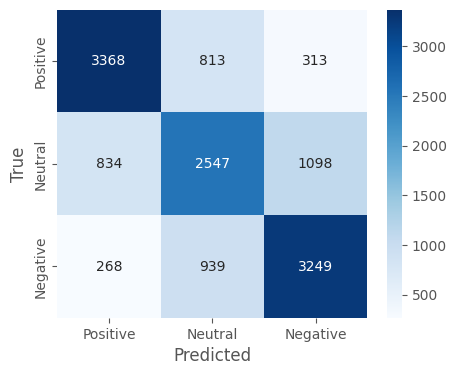

LSTM
Acc - F1 - Pre - Rec:  65.2  -  65.53  -  66.11  -  65.2


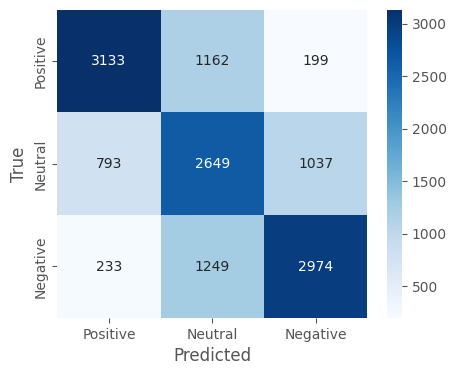

BERT
Acc - F1 - Pre - Rec:  66.13  -  66.41  -  66.92  -  66.13


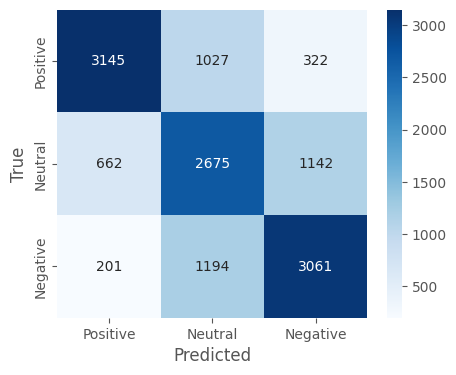

In [21]:
print('LR')
evaluate(pred_lr, y_test, IMAGE_DIR + 'cm_lr.png')

print('LSTM')
evaluate(pred_lstm, y_test, IMAGE_DIR + 'cm_lstm.png')

print('BERT')
evaluate(pred_bert, y_test, IMAGE_DIR + 'cm_bert.png')

# Predictions' wordclouds

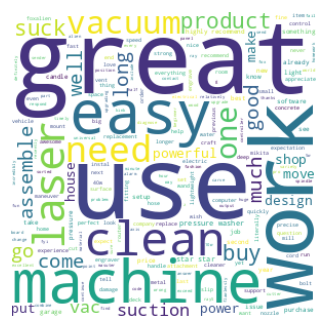

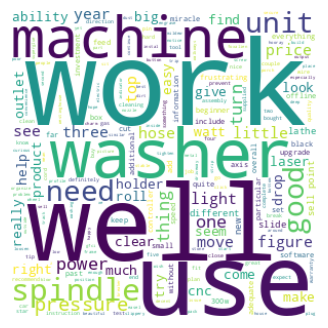

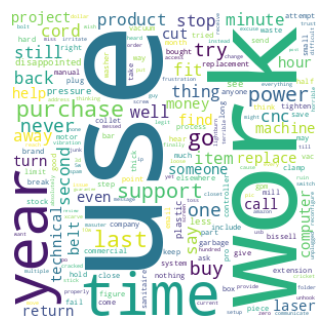

In [22]:
_, _, _, _, _, _, _, _, ind_df = get_data()
ind_texts = ind_df.processedReviewText.values
ind_df = pd.DataFrame({'ind_texts': ind_texts, 'lr_pred': pred_ind_lr, 'lstm_pred': pred_ind_lstm, 'bert_pred': pred_ind_bert})

# Helper function to create and save WordCloud
def generate_wordcloud(texts, save_path, figsize=(6, 4), dpi=100):
    wc = WordCloud(width=300, height=300, background_color='white').generate(" ".join(texts))
    plt.figure(figsize=figsize)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.savefig(save_path, dpi=dpi, bbox_inches='tight', pad_inches=0.01)
    plt.show()

# Generate word clouds for positive, neutral, and negative predictions
generate_wordcloud(ind_df[ind_df.lr_pred == 0].ind_texts, IMAGE_DIR + 'wc_lr_pos.png')
generate_wordcloud(ind_df[ind_df.lr_pred == 1].ind_texts, IMAGE_DIR + 'wc_lr_neu.png')
generate_wordcloud(ind_df[ind_df.lr_pred == 2].ind_texts, IMAGE_DIR + 'wc_lr_neg.png')

# Top important features (each model, each XAI technique)

In [ ]:
_, _, _, _, X_test, y_test, _, _, ind_df = get_data()
ind_texts = ind_df.processedReviewText.values

In [ ]:
test_df = pd.DataFrame({'X_test': X_test, 'lr_pred': pred_lr, 'lstm_pred': pred_lstm, 'bert_pred': pred_bert})
ind_df = pd.DataFrame({'ind_texts': ind_texts, 'lr_pred': pred_ind_lr, 'lstm_pred': pred_ind_lstm, 'bert_pred': pred_ind_bert})

In [ ]:
def resample_if_one_word(df, sentiment_col, text_col, sentiment, n, random_state):
    return df[df[sentiment_col] == sentiment]
    sample = df[df[sentiment_col] == sentiment].sample(n=n, random_state=random_state)
    while any(len(x.split()) == 1 for x in sample[text_col]):
        random_state += 1
        sample = df[df[sentiment_col] == sentiment].sample(n=n, random_state=random_state)
    return sample[text_col].map(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x)).tolist()

In [ ]:
num_sample_per_sentiment = 10

def resample_if_one_word(df, sentiment_col, text_col, sentiment, n, random_state):
    sample = df[df[sentiment_col] == sentiment].sample(n=n, random_state=random_state)
    while any(len(x.split()) == 1 for x in sample[text_col]):
        random_state += 1
        sample = df[df[sentiment_col] == sentiment].sample(n=n, random_state=random_state)
    return sample[text_col].map(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x)).tolist()


pos_lr_test_sample = resample_if_one_word(test_df, 'lr_pred', 'X_test', 0, num_sample_per_sentiment, 30)
neu_lr_test_sample = resample_if_one_word(test_df, 'lr_pred', 'X_test', 1, num_sample_per_sentiment, 32)
neg_lr_test_sample = resample_if_one_word(test_df, 'lr_pred', 'X_test', 2, num_sample_per_sentiment, 242)
lr_test_sample = np.concatenate([pos_lr_test_sample, neu_lr_test_sample, neg_lr_test_sample])
random.shuffle(lr_test_sample)

pos_lstm_test_sample = resample_if_one_word(test_df, 'lstm_pred', 'X_test', 0, num_sample_per_sentiment, 31)
neu_lstm_test_sample = resample_if_one_word(test_df, 'lstm_pred', 'X_test', 1, num_sample_per_sentiment, 189)
neg_lstm_test_sample = resample_if_one_word(test_df, 'lstm_pred', 'X_test', 2, num_sample_per_sentiment, 25)
lstm_test_sample = np.concatenate([pos_lstm_test_sample, neu_lstm_test_sample, neg_lstm_test_sample])
random.shuffle(lstm_test_sample)

pos_bert_test_sample = resample_if_one_word(test_df, 'bert_pred', 'X_test', 0, num_sample_per_sentiment, 310)
neu_bert_test_sample = resample_if_one_word(test_df, 'bert_pred', 'X_test', 1, num_sample_per_sentiment, 30)
neg_bert_test_sample = resample_if_one_word(test_df, 'bert_pred', 'X_test', 2, num_sample_per_sentiment, 31)
bert_test_sample = np.concatenate([pos_bert_test_sample, neu_bert_test_sample, neg_bert_test_sample])
random.shuffle(bert_test_sample)

pos_lr_ind_text = resample_if_one_word(ind_df, 'lr_pred', 'ind_texts', 0,num_sample_per_sentiment, 30)
neu_lr_ind_text = resample_if_one_word(ind_df, 'lr_pred', 'ind_texts', 1,num_sample_per_sentiment, 31)
neg_lr_ind_text = resample_if_one_word(ind_df, 'lr_pred', 'ind_texts', 2,num_sample_per_sentiment, 32)
lr_ind_text = np.concatenate([pos_lr_ind_text, neu_lr_ind_text, neg_lr_ind_text])
random.shuffle(lr_ind_text)

pos_lstm_ind_text = resample_if_one_word(ind_df, 'lstm_pred', 'ind_texts', 0,num_sample_per_sentiment, 33)
neu_lstm_ind_text = resample_if_one_word(ind_df, 'lstm_pred', 'ind_texts', 1,num_sample_per_sentiment, 34)
neg_lstm_ind_text = resample_if_one_word(ind_df, 'lstm_pred', 'ind_texts', 2,num_sample_per_sentiment, 35)
lstm_ind_text = np.concatenate([pos_lstm_ind_text, neu_lstm_ind_text, neg_lstm_ind_text])
random.shuffle(lstm_ind_text)

pos_bert_ind_text = resample_if_one_word(ind_df, 'bert_pred', 'ind_texts', 0,num_sample_per_sentiment, 36)
neu_bert_ind_text = resample_if_one_word(ind_df, 'bert_pred', 'ind_texts', 1,num_sample_per_sentiment, 37)
neg_bert_ind_text = resample_if_one_word(ind_df, 'bert_pred', 'ind_texts', 2,num_sample_per_sentiment, 38)
bert_ind_text = np.concatenate([pos_bert_ind_text, neu_bert_ind_text, neg_bert_ind_text])
random.shuffle(bert_ind_text)

In [ ]:
lr_test_sample.shape, lstm_test_sample.shape, bert_test_sample.shape

((30,), (30,), (30,))

In [ ]:
lr_ind_text.shape, lstm_ind_text.shape, bert_ind_text.shape

((30,), (30,), (30,))

## LIME

In [ ]:
explainer = LimeTextExplainer(class_names=['Positive', 'Neutral', 'Negative'])

def get_important_features_lime(instance, predict_proba, top_features=5):
    feature_importance = defaultdict(float)
    for index, text in enumerate(instance):
        exp = explainer.explain_instance(text, predict_proba, num_features=20)
        for feature, weight in exp.as_list():
            feature_importance[feature] += abs(weight)
    top_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)[:top_features]
    top_features = {feature: round(round(weight, 4), 2) for feature, weight in top_features}
    return top_features

### LR

In [ ]:
get_important_features_lime(pos_lr_test_sample, model_wrapper.predict_proba_lr), get_important_features_lime(pos_lr_ind_text, model_wrapper.predict_proba_lr)

({'love': 0.38,
  'great': 0.36,
  'frustrate': 0.27,
  'everything': 0.18,
  'recommend': 0.17},
 {'easy': 0.49,
  'great': 0.43,
  'pleasantly': 0.26,
  'regret': 0.24,
  'pressure': 0.19})

In [ ]:
get_important_features_lime(neu_lr_test_sample, model_wrapper.predict_proba_lr), get_important_features_lime(neu_lr_ind_text, model_wrapper.predict_proba_lr)

({'frustrate': 0.27,
  'sometimes': 0.2,
  'kind': 0.18,
  'difficult': 0.18,
  'gorgeous': 0.17},
 {'3': 0.41, 'star': 0.36, 'pressure': 0.23, 'good': 0.23, 'three': 0.21})

In [ ]:
get_important_features_lime(neg_lr_test_sample, model_wrapper.predict_proba_lr), get_important_features_lime(neg_lr_ind_text, model_wrapper.predict_proba_lr)

({'disappointed': 0.34,
  'even': 0.21,
  'buy': 0.2,
  'return': 0.19,
  'star': 0.18},
 {'money': 0.29,
  'disappointed': 0.26,
  'useless': 0.21,
  'waste': 0.19,
  'still': 0.16})

### LSTM

In [ ]:
get_important_features_lime(pos_lstm_test_sample, model_wrapper.predict_proba_lstm), get_important_features_lime(pos_lstm_ind_text, model_wrapper.predict_proba_lstm)

({'great': 1.2, 'love': 0.6, 'good': 0.36, 'expect': 0.34, 'recommend': 0.31},
 {'easy': 0.84,
  'great': 0.8,
  'recommend': 0.61,
  'would': 0.46,
  'powerful': 0.38})

In [ ]:
get_important_features_lime(neu_lstm_test_sample, model_wrapper.predict_proba_lstm), get_important_features_lime(neu_lstm_ind_text, model_wrapper.predict_proba_lstm)

({'small': 0.44, 'great': 0.34, 'love': 0.32, 'bit': 0.32, 'seem': 0.3},
 {'would': 0.28, 'long': 0.25, 'mill': 0.24, 'plastic': 0.23, 'machine': 0.23})

In [ ]:
get_important_features_lime(neg_lstm_test_sample, model_wrapper.predict_proba_lstm), get_important_features_lime(neg_lstm_ind_text, model_wrapper.predict_proba_lstm)

({'pretty': 0.29,
  'software': 0.27,
  'date': 0.26,
  'work': 0.24,
  'dictation': 0.23},
 {'money': 0.42, 'waste': 0.35, 'useless': 0.32, 'work': 0.28, 'buy': 0.23})

### BERT

In [ ]:
get_important_features_lime(pos_bert_test_sample, model_wrapper.predict_proba_bert), get_important_features_lime(pos_bert_ind_text, model_wrapper.predict_proba_bert)

100%|██████████| 79/79 [00:14<00:00,  5.29it/s]


({'great': 0.83,
  'safely': 0.32,
  'perfect': 0.27,
  'delightful': 0.24,
  'love': 0.23},
 {'great': 0.91,
  'unbelievable': 0.69,
  'pleasantly': 0.4,
  'easy': 0.37,
  'item': 0.32})

In [ ]:
get_important_features_lime(neu_bert_test_sample, model_wrapper.predict_proba_bert), get_important_features_lime(neu_bert_ind_text, model_wrapper.predict_proba_bert)

100%|██████████| 79/79 [00:15<00:00,  5.26it/s]


({'vshield': 0.64,
  'slow': 0.61,
  'well': 0.41,
  'iridescence': 0.38,
  'difficulity': 0.37},
 {'pressure': 0.71,
  'recommend': 0.46,
  'good': 0.42,
  'threestar': 0.41,
  'great': 0.38})

In [ ]:
get_important_features_lime(neg_bert_test_sample, model_wrapper.predict_proba_bert), get_important_features_lime(neg_bert_ind_text, model_wrapper.predict_proba_bert)

100%|██████████| 79/79 [00:15<00:00,  5.23it/s]


({'certain': 0.95, 'properly': 0.49, 'part': 0.32, 'game': 0.31, '118': 0.3},
 {'well': 0.88,
  'company': 0.38,
  'little': 0.35,
  'vacuum': 0.33,
  'empty': 0.32})

## SHAP

In [ ]:
top_k_features = 5

In [ ]:
def get_explanation_shap(model, texts, tokenizer=None):
    print('len data: ', len(texts))
    masker = shap.maskers.Text()
    if tokenizer:
        masker = shap.maskers.Text(tokenizer=tokenizer)
    explainer = shap.Explainer(model, masker)
    shap_values = explainer(texts)
    return shap_values

def get_important_features_shap(shap_values, texts, k=5):
    # for each class
    important_features = {}
    for i in range(3):
        # Combine SHAP values from all samples
        combined_shap = np.concatenate([sv.values[:, i] for sv in shap_values])
        combined_texts = list(chain.from_iterable([word_tokenize(text) for text in texts]))
        temp_df = pd.DataFrame({'word': combined_texts, 'shap_value': combined_shap})
        temp_df['shap_value'] = temp_df['shap_value'].apply(lambda x: np.abs(x))
        temp_df = temp_df.groupby('word')['shap_value'].sum().sort_values(ascending=False)
        top_k_re = dict(temp_df.iloc[:k])
        top_k_re = {word: round(value, 2) for word, value in dict(temp_df.iloc[:k]).items()}
        important_features[i] = top_k_re
    return important_features

In [ ]:
# for a, (i, j) in enumerate(zip([len(i) for i in shap_values.data], [len(i.split()) for i in lr_ind_text])):
#     if i != j:
#         print(a)

### LR

In [ ]:
print('testing domain (A)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_lr, lr_test_sample)
important_features_shap = get_important_features_shap(shap_values, lr_test_sample, top_k_features)
important_features_shap

testing domain (A)
len data:  30


{0: {'great': 1.06, 'love': 0.86, 'easy': 0.49, 'get': 0.44, 'perfect': 0.43},
 1: {'love': 0.36,
  'great': 0.35,
  'get': 0.31,
  'frustrate': 0.3,
  'disappointed': 0.3},
 2: {'great': 0.78,
  'disappointed': 0.68,
  'love': 0.61,
  'get': 0.41,
  'well': 0.38}}

In [ ]:
print('industrial domain (B)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_lr, lr_ind_text)
important_features_shap = get_important_features_shap(shap_values, lr_ind_text, top_k_features)
important_features_shap

industrial domain (B)
len data:  30


{0: {'easy': 1.29, 'great': 0.91, 'work': 0.82, 'well': 0.61, 'year': 0.61},
 1: {'work': 0.57,
  'easy': 0.51,
  'pressure': 0.39,
  'star': 0.36,
  'great': 0.34},
 2: {'easy': 0.78, 'work': 0.68, 'great': 0.6, 'well': 0.6, 'use': 0.5}}

### LSTM

In [ ]:
print('testing domain (A)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_lstm, lstm_test_sample)
important_features_shap = get_important_features_shap(shap_values, lstm_test_sample, top_k_features)
important_features_shap

testing domain (A)
len data:  30


{0: {'great': 3.34, 'love': 1.41, 'good': 0.94, 'nice': 0.78, 'small': 0.68},
 1: {'great': 1.91,
  'love': 1.03,
  'nice': 0.54,
  'recommend': 0.49,
  'good': 0.43},
 2: {'great': 1.59,
  'return': 0.76,
  'disappointed': 0.59,
  'good': 0.52,
  'work': 0.49}}

In [ ]:
print('industrial domain (B)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_lstm, lstm_ind_text)
important_features_shap = get_important_features_shap(shap_values, lstm_ind_text, top_k_features)
important_features_shap

industrial domain (B)
len data:  30


{0: {'great': 2.18, 'easy': 1.41, 'machine': 1.03, 'suck': 1.03, 'good': 1.01},
 1: {'great': 1.23,
  'recommend': 0.93,
  'highly': 0.66,
  'easy': 0.64,
  'work': 0.58},
 2: {'vacuum': 1.14,
  'work': 1.05,
  'great': 0.99,
  'machine': 0.93,
  'good': 0.91}}

### BERT

In [ ]:
print('testing domain (A)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_bert, bert_test_sample)
important_features_shap = get_important_features_shap(shap_values, bert_test_sample, top_k_features)
important_features_shap

testing domain (A)
len data:  30


100%|██████████| 1/1 [00:00<00:00, 71.73it/s]

100%|██████████| 1/1 [00:00<00:00, 83.33it/s]

100%|██████████| 1/1 [00:00<00:00, 82.04it/s]

100%|██████████| 1/1 [00:00<00:00, 62.66it/s]

100%|██████████| 1/1 [00:00<00:00, 61.57it/s]

100%|██████████| 1/1 [00:00<00:00, 57.49it/s]

100%|██████████| 1/1 [00:00<00:00, 61.80it/s]

100%|██████████| 1/1 [00:00<00:00, 58.93it/s]

100%|██████████| 1/1 [00:00<00:00, 58.45it/s]

100%|██████████| 1/1 [00:00<00:00, 59.04it/s]

100%|██████████| 1/1 [00:00<00:00, 56.36it/s]

100%|██████████| 1/1 [00:00<00:00, 59.33it/s]

100%|██████████| 1/1 [00:00<00:00, 57.98it/s]

100%|██████████| 1/1 [00:00<00:00, 52.98it/s]

100%|██████████| 1/1 [00:00<00:00, 45.46it/s]

100%|██████████| 1/1 [00:00<00:00, 51.09it/s]

100%|██████████| 1/1 [00:00<00:00, 51.21it/s]

100%|██████████| 1/1 [00:00<00:00, 57.85it/s]

100%|██████████| 1/1 [00:00<00:00, 52.62it/s]

100%|██████████| 1/1 [00:00<00:00, 57.89it/s]

100%|██████████| 1/1 [00:00<00:00, 51.65it/s]

100%|████████

{0: {'great': 2.4,
  'love': 0.8,
  'work': 0.78,
  'safely': 0.48,
  'excellent': 0.48},
 1: {'work': 1.7, 'great': 1.14, 'part': 0.82, 'love': 0.77, 'game': 0.59},
 2: {'great': 1.32, 'work': 0.95, 'love': 0.8, 'part': 0.71, 'charge': 0.55}}

In [ ]:
print('industrial domain (B)')
shap_values = get_explanation_shap(model_wrapper.predict_proba_bert, bert_ind_text)
important_features_shap = get_important_features_shap(shap_values, bert_ind_text, top_k_features)
important_features_shap

industrial domain (B)
len data:  30


100%|██████████| 1/1 [00:00<00:00, 67.35it/s]

100%|██████████| 1/1 [00:00<00:00, 80.37it/s]

100%|██████████| 1/1 [00:00<00:00, 50.95it/s]

100%|██████████| 1/1 [00:00<00:00, 66.97it/s]

100%|██████████| 1/1 [00:00<00:00, 51.46it/s]

100%|██████████| 1/1 [00:00<00:00, 47.14it/s]

100%|██████████| 1/1 [00:00<00:00, 51.51it/s]

100%|██████████| 1/1 [00:00<00:00, 59.39it/s]

100%|██████████| 1/1 [00:00<00:00, 55.09it/s]

100%|██████████| 1/1 [00:00<00:00, 50.83it/s]

100%|██████████| 1/1 [00:00<00:00, 53.73it/s]

100%|██████████| 1/1 [00:00<00:00, 61.35it/s]

100%|██████████| 1/1 [00:00<00:00, 53.62it/s]

100%|██████████| 1/1 [00:00<00:00, 56.25it/s]

100%|██████████| 1/1 [00:00<00:00, 47.74it/s]

100%|██████████| 1/1 [00:00<00:00, 39.34it/s]

100%|██████████| 1/1 [00:00<00:00, 60.92it/s]

100%|██████████| 1/1 [00:00<00:00, 40.44it/s]

100%|██████████| 1/1 [00:00<00:00, 55.22it/s]

100%|██████████| 1/1 [00:00<00:00, 58.93it/s]

100%|██████████| 1/1 [00:00<00:00, 42.15it/s]

100%|████████

{0: {'great': 2.88,
  'pressure': 1.14,
  'powerful': 0.85,
  'work': 0.84,
  'well': 0.82},
 1: {'well': 1.7, 'great': 1.46, 'pressure': 1.37, 'work': 1.32, 'good': 0.87},
 2: {'great': 1.81, 'well': 1.74, 'good': 0.95, 'work': 0.78, 'burn': 0.64}}

## Saliency Map

### LR

In [ ]:
def get_saliency_map_lr_tfidf(model, vectorizer, texts):
    X = vectorizer.transform(texts)
    feature_names = vectorizer.get_feature_names_out()

    word_scores = {0: {}, 1: {}, 2: {}}
    for class_idx in range(3):
        coef = model.coef_[class_idx]
        saliency_scores = X.multiply(coef).tocsr()

        for i in range(X.shape[0]):
            for j in range(len(feature_names)):
                if X[i, j] != 0:
                    word = feature_names[j]
                    # Use absolute value here
                    score = abs(saliency_scores[i, j])
                    if word in word_scores[class_idx]:
                        word_scores[class_idx][word] += score
                    else:
                        word_scores[class_idx][word] = score
    sorted_words = {}
    for class_idx in range(3):
        sorted_words[class_idx] = sorted(word_scores[class_idx].items(), key=lambda x: x[1], reverse=True)
    return sorted_words

In [ ]:
def slice_dict_5(dic):
    return {key: value[:5] for key, value in dic.items()}

In [ ]:
vectorizer = model_wrapper.vectorizer_lr
lr = model_wrapper.lr

saliency_map_1 = get_saliency_map_lr_tfidf(lr, vectorizer, lr_test_sample)
saliency_map_2 = get_saliency_map_lr_tfidf(lr, vectorizer, lr_ind_text)
slice_dict_5(saliency_map_1), slice_dict_5(saliency_map_2)

({0: [('love', 7.237408119916051),
   ('disappointed', 5.709210279960226),
   ('great', 4.632784506549081),
   ('frustrate', 2.534119222114964),
   ('compliment', 2.028800495392035)],
  1: [('recommend', 1.1139860278142315),
   ('decent', 0.545871538301324),
   ('think', 0.5451746137869586),
   ('ok', 0.5028854224151619),
   ('sure', 0.4455053542940729)],
  2: [('great', 4.811979103629733),
   ('love', 3.8667406933606303),
   ('disappointed', 3.0237290298923583),
   ('awful', 1.7543356221461268),
   ('sometimes', 1.5921940730910666)]},
 {0: [('easy', 4.901056240170223),
   ('great', 3.722287389334532),
   ('pressure', 3.3728691353187914),
   ('disappointed', 2.454974565094031),
   ('useless', 1.9859591300355546)],
  1: [('3 star', 3.781869570826171),
   ('give three', 1.265884304569716),
   ('recommend', 1.1283146177369314),
   ('regret', 0.9137991089999494),
   ('buy', 0.7569471440039175)],
  2: [('easy', 5.476885257821453),
   ('great', 3.866264254221573),
   ('good', 2.8562003218611

<ipython-input-107-455207f727c9>:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
<ipython-input-107-455207f727c9>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')


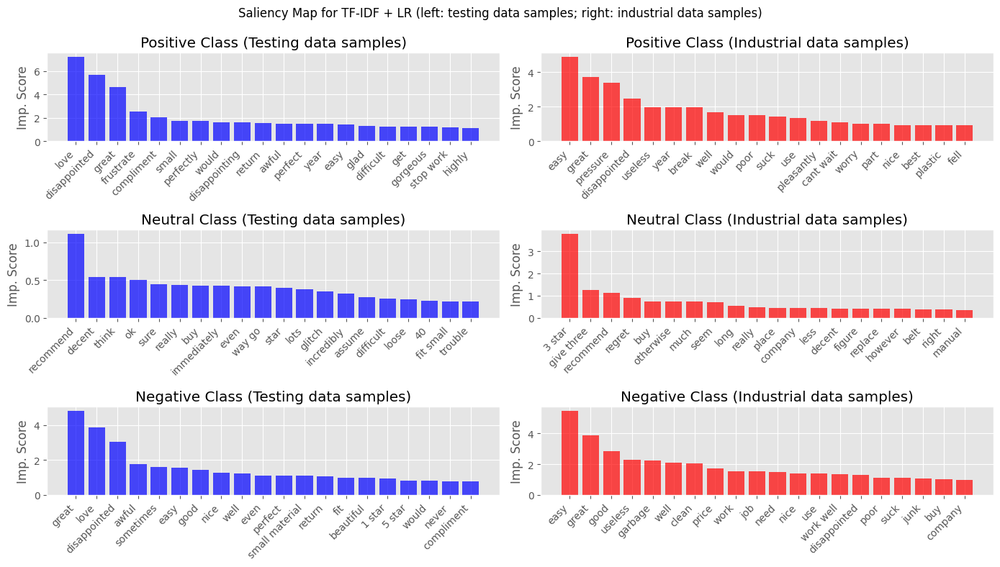

In [ ]:
vectorizer = model_wrapper.vectorizer_lr
lr = model_wrapper.lr

saliency_map_1 = get_saliency_map_lr_tfidf(lr, vectorizer, lr_test_sample)
saliency_map_2 = get_saliency_map_lr_tfidf(lr, vectorizer, lr_ind_text)

class_names = ['Positive', 'Neutral', 'Negative']

# Print top 10 important words for each class from both samples
# for class_idx in range(3):
#     print(f"\nTop 10 most important words for {class_names[class_idx]} class (Sample 1):")
#     for word, score in saliency_map_1[class_idx][:10]:
#         print(f"{word}: {score}")

#     print(f"\nTop 10 most important words for {class_names[class_idx]} class (Sample 2):")
#     for word, score in saliency_map_2[class_idx][:10]:
#         print(f"{word}: {score}")


fig, axs = plt.subplots(3, 2, figsize=(14, 8))
fig.suptitle("Saliency Map for TF-IDF + LR (left: testing data samples; right: industrial data samples)")

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliency_map_1[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 0].bar(words_1, scores_1, color='b', alpha=0.7)
    axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
    axs[class_idx, 0].set_title(f"{class_names[class_idx]} Class (Testing data samples)")
    axs[class_idx, 0].set_xlabel("")
    axs[class_idx, 0].set_ylabel("Imp. Score")

    # Sample 2
    words_2, scores_2 = zip(*sorted(saliency_map_2[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 1].bar(words_2, scores_2, color='r', alpha=0.7)
    axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')
    axs[class_idx, 1].set_title(f"{class_names[class_idx]} Class (Industrial data samples)")
    axs[class_idx, 1].set_xlabel("")
    axs[class_idx, 1].set_ylabel("Imp. Score")

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig(IMAGE_DIR + 'saliency_map_lr.png')
plt.show()

### LSTM

In [ ]:
def get_saliency_map_lstm(model, texts):
    word_scores = {0: {}, 1: {}, 2: {}}
    for text in texts:
        tokens = text.split()
        original_pred = model([text])[0]

        for i, word in enumerate(tokens):
            new_text = ' '.join(tokens[:i] + tokens[i+1:])
            new_pred = model([new_text])[0]

            diff = original_pred - new_pred

            for class_idx in range(3):
                # use abs importance score
                if word in word_scores[class_idx]:
                    word_scores[class_idx][word] += abs(diff[class_idx])
                else:
                    word_scores[class_idx][word] = abs(diff[class_idx])
    sorted_words = {}
    for class_idx in range(3):
        sorted_words[class_idx] = sorted(word_scores[class_idx].items(), key=lambda x: x[1], reverse=True)
    return sorted_words

In [ ]:
saliency_map_1 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_test_sample)
saliency_map_2 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_ind_text)
slice_dict_5(saliency_map_1), slice_dict_5(saliency_map_2)

({0: [('love', 2.34747),
   ('terrible', 0.9186413),
   ('much', 0.6322487),
   ('meet', 0.536569),
   ('hitch', 0.4932835)],
  1: [('love', 1.7135898),
   ('much', 0.5485101),
   ('good', 0.5133044),
   ('meet', 0.47084293),
   ('terrible', 0.4557234)],
  2: [('love', 0.63388),
   ('good', 0.61231863),
   ('program', 0.51573443),
   ('terrible', 0.46291807),
   ('limit', 0.37075302)]},
 {0: [('easy', 2.3380811),
   ('great', 1.661615),
   ('incredible', 0.7744844),
   ('vacuum', 0.6585001),
   ('plenty', 0.6420759)],
  1: [('easy', 1.8962295),
   ('great', 1.2309792),
   ('money', 0.74482596),
   ('work', 0.6664698),
   ('vacuum', 0.62141603)],
  2: [('money', 0.824859),
   ('waste', 0.6350567),
   ('good', 0.6065107),
   ('useless', 0.5752072),
   ('great', 0.5682046)]})

In [ ]:
saliency_map_1 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_test_sample)
saliency_map_2 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_ind_text)

<ipython-input-47-4ead5f6421a6>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
<ipython-input-47-4ead5f6421a6>:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')


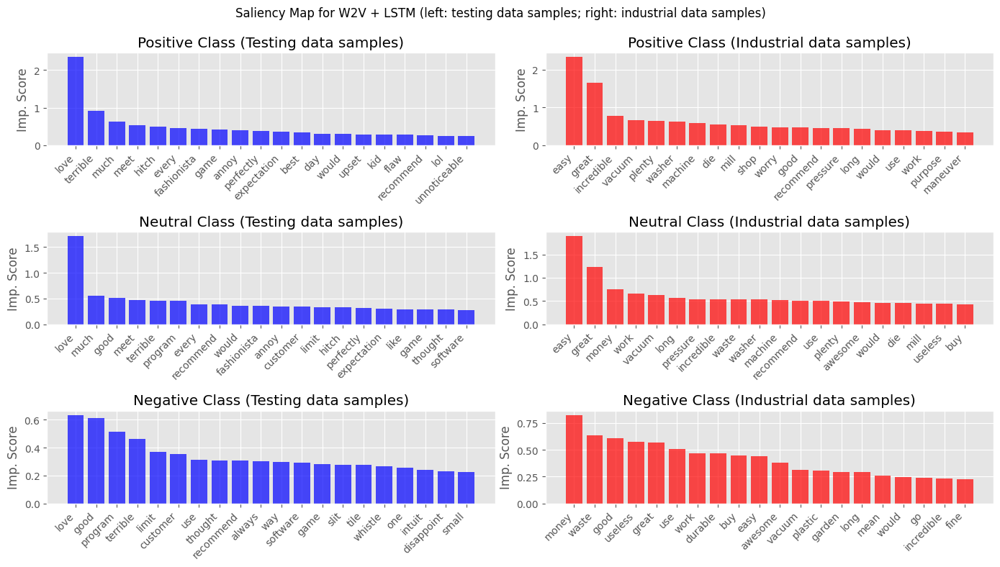

In [ ]:
# get saliency maps
saliency_map_1 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_test_sample)
saliency_map_2 = get_saliency_map_lstm(model_wrapper.predict_proba_lstm, lstm_ind_text)

class_names = ['Positive', 'Neutral', 'Negative']
# for class_idx in range(3):
#     print(f"\nTop 10 most important words for {class_names[class_idx]} class:")
#     for word, score in saliency_map[class_idx][:10]:
#         print(f"{word}: {score}")

fig, axs = plt.subplots(3, 2, figsize=(14, 8))
fig.suptitle("Saliency Map for W2V + LSTM (left: testing data samples; right: industrial data samples)")

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliency_map_1[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 0].bar(words_1, scores_1, color='b', alpha=0.7)
    axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
    axs[class_idx, 0].set_title(f"{class_names[class_idx]} Class (Testing data samples)")
    axs[class_idx, 0].set_xlabel("")
    axs[class_idx, 0].set_ylabel("Imp. Score")

    # Sample 2
    words_2, scores_2 = zip(*sorted(saliency_map_2[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 1].bar(words_2, scores_2, color='r', alpha=0.7)
    axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')
    axs[class_idx, 1].set_title(f"{class_names[class_idx]} Class (Industrial data samples)")
    axs[class_idx, 1].set_xlabel("")
    axs[class_idx, 1].set_ylabel("Imp. Score")

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig(IMAGE_DIR + 'saliency_map_lstm.png')
plt.show()

### BERT

In [ ]:
def get_saliency_map_bert(model, tokenizer, texts, target_class):
    model.eval()
    saliencies = {}
    for text in texts:
        # tokenize the texts
        inputs = tokenizer(text, return_tensors="pt", padding='max_length', truncation=True, max_length=60)
        input_ids = inputs["input_ids"].to(device)
        attention_mask = inputs["attention_mask"].to(device)

        # create a tensor of embeddings
        embeddings = model.bert.embeddings.word_embeddings(input_ids).detach()
        embeddings.requires_grad = True

        # forward
        outputs = model(inputs_embeds=embeddings, attention_mask=attention_mask)
        logits = outputs.logits

        # backward
        loss = logits[0, target_class]
        model.zero_grad()
        loss.backward()

        # saliency
        saliency = embeddings.grad.abs().sum(dim=-1).squeeze(0)
        saliency = saliency / saliency.max() if saliency.max() != 0 else saliency

        # add saliency scores to the dictionary
        tokens = tokenizer.convert_ids_to_tokens(input_ids[0])
        for token, score in zip(tokens, saliency.detach().cpu().numpy()):
            if token.startswith('##') or token in ['[CLS]', '[SEP]', '[PAD]']:
                continue
            if token in saliencies:
                saliencies[token] += score
            else:
                saliencies[token] = score

    # normalize and get top 10
    max_saliency = max(saliencies.values())
    normalized_saliencies = {token: score / max_saliency for token, score in saliencies.items()}
    sorted_saliencies = sorted(normalized_saliencies.items(), key=lambda x: x[1], reverse=True)
    return sorted_saliencies[:20]

class_name = {0: 'Positive', 1: 'Neutral', 2: 'Negative'}

def plot_saliency_map(saliencies, tokenizer, class_label, saved_name):
    tokens, scores = zip(*saliencies)
    plt.figure(figsize=(20, 3))
    plt.bar(tokens, scores)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Importance Score')
    class_name_ = class_name[class_label]
    plt.title('Top 10 Most Important Features for ' + class_name_)
    plt.tight_layout()
    # plt.savefig(saved_name)
    plt.show()

In [ ]:
model, tokenizer = load_bert_model()
model.to(device)
# for each class
saliencies_classes_1 = {}
saliencies_classes_2 = {}
for target_class in range(3):
    saliencies_1 = get_saliency_map_bert(model, tokenizer, bert_test_sample, target_class)
    saliencies_2 = get_saliency_map_bert(model, tokenizer, bert_ind_text, target_class)
    saliencies_classes_1[target_class] = saliencies_1
    saliencies_classes_2[target_class] = saliencies_2

In [ ]:
slice_dict_5(saliencies_classes_1), slice_dict_5(saliencies_classes_2)

({0: [('work', 1.0),
   ('great', 0.9925722),
   ('get', 0.71616966),
   ('fit', 0.5604029),
   ('thanks', 0.5457458)],
  1: [('great', 1.0),
   ('work', 0.9408544),
   ('get', 0.62727755),
   ('like', 0.56585145),
   ('part', 0.55865616)],
  2: [('great', 1.0),
   ('work', 0.9683241),
   ('get', 0.85327804),
   ('part', 0.6442752),
   ('like', 0.57219213)]},
 {0: [('great', 1.0),
   ('would', 0.9106532),
   ('laser', 0.78310513),
   ('pressure', 0.75203145),
   ('well', 0.74398553)],
  1: [('great', 1.0),
   ('would', 0.9449584),
   ('well', 0.79847443),
   ('laser', 0.7982907),
   ('pressure', 0.75271815)],
  2: [('great', 1.0),
   ('would', 0.8889475),
   ('laser', 0.7995983),
   ('work', 0.7708831),
   ('well', 0.7481909)]})

<ipython-input-135-ba41e7911735>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
<ipython-input-135-ba41e7911735>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')


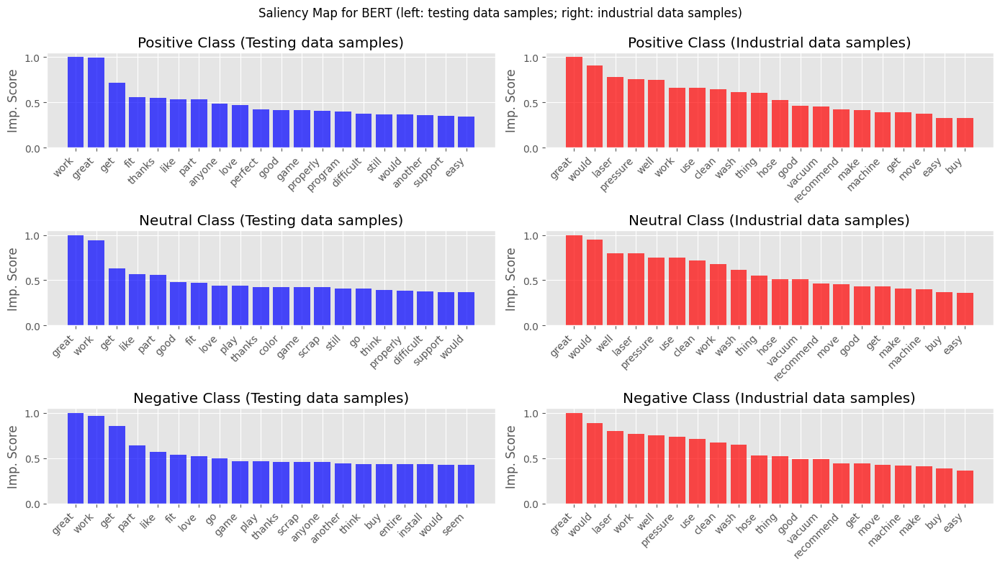

In [ ]:
class_names = ['Positive', 'Neutral', 'Negative']
fig, axs = plt.subplots(3, 2, figsize=(14, 8))
fig.suptitle("Saliency Map for BERT (left: testing data samples; right: industrial data samples)")

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliencies_classes_1[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 0].bar(words_1, scores_1, color='b', alpha=0.7)
    axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
    axs[class_idx, 0].set_title(f"{class_names[class_idx]} Class (Testing data samples)")
    axs[class_idx, 0].set_xlabel("")
    axs[class_idx, 0].set_ylabel("Imp. Score")

    # Sample 2
    words_2, scores_2 = zip(*sorted(saliencies_classes_2[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 1].bar(words_2, scores_2, color='r', alpha=0.7)
    axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')
    axs[class_idx, 1].set_title(f"{class_names[class_idx]} Class (Industrial data samples)")
    axs[class_idx, 1].set_xlabel("")
    axs[class_idx, 1].set_ylabel("Imp. Score")

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig(IMAGE_DIR + 'saliency_map_bert.png')
plt.show()

# Consistency (Overlapping)

In [23]:
with open(DATA_DIR + 'industrial_data.txt', 'r') as file:
    review_text = [line.strip() for line in file]
ind_df['review_text'] = review_text

In [24]:
instance = ind_df.loc[9]
instance.review_text, instance.ind_texts

('I recently bought the Longer RAY5 Laser Engraver, and it has exceeded my expectations in every way. The 5W output laser, combined with the 40W laser engraving cutter, makes it incredibly powerful and precise for a variety of material including wood and metal. The engraver works flawlessly and is very easy to set up and use.',
 'recently buy long ray5 laser engraver exceed expectation every way 5w output laser combine 40w laser engrave cutter make incredibly powerful precise variety material include wood metal engraver work flawlessly easy set use')

In [25]:
instance = ind_df.loc[28]
instance.review_text, instance.ind_texts

("Product is great for washing cars and some light cleaning of porches and driveways. However, I could not get it work with any of my outside outlets as they are all GFCI. After 10-20 seconds of working, it would trip my breakers. Tried all outlets. Ended up having to plug inside the house in a standard outlet with an extension cord, then worked as it should have. I don't know if something is wrong with my unit or what. If you are looking for a pressure to do things other than wash a car, get something with more power and way more gpm. Would recommend a gas washer.",
 'product great washing car light clean porch driveway however could get work outside outlet gfci 1020 second work would trip breaker try outlet end plug inside house standard outlet extension cord work know something wrong unit look pressure thing wash car get something power way gpm would recommend gas washer')

## LIME

In [ ]:
def explain_instance_lime(instance, model_wrapper, save_path, class_names=['Positive', 'Neutral', 'Negative']):
    explainer = LimeTextExplainer(class_names=class_names)
    for class_idx, class_name in enumerate(class_names):
        exp = explainer.explain_instance(instance, model_wrapper.predict_proba_lr, num_features=10, labels=[class_idx])
        if class_idx in exp.local_exp:
            exp.show_in_notebook()
            fig = exp.as_pyplot_figure(label=class_idx)
            plt.title(f'Explanation for {class_name} class')
            plt.savefig(save_path + f'{class_name}.png', bbox_inches='tight')
            plt.close(fig)
            plt.show()
        else:
            print(f"No explanation found for class {class_name} (index {class_idx})")

In [ ]:
instance_text = ind_df.loc[9].ind_texts
explain_instance_lime(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'CONSISTENCY_LIME_instance_9_')

In [ ]:
instance_text = ind_df.loc[28].ind_texts
explain_instance_lime(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'CONSISTENCY_LIME_instance_28_')

## SHAP

In [ ]:
def explain_instance_shap(instance, model_wrapper, save_path, class_names=['Positive', 'Neutral', 'Negative']):
    explainer = shap.Explainer(model_wrapper.predict_proba_lr, masker=shap.maskers.Text())
    shap_values = explainer([instance])
    for class_idx, class_name in enumerate(class_names):
        plt.figure(figsize=(10, 6))
        shap.plots.text(shap_values[0, :, class_idx])
        print('\n\n\n\n')

In [ ]:
print()
print()
print()
instance_text = ind_df.loc[9].ind_texts
explain_instance_shap(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'CONSISTENCY_SHAP_instance_9_')

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [ ]:
print()
print()
print()
instance_text = ind_df.loc[28].ind_texts
explain_instance_shap(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'CONSISTENCY_SHAP_instance_28_')

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

## Saliency Map

In [26]:
def get_saliency_map_lr_tfidf(model, vectorizer, texts):
    X = vectorizer.transform(texts)
    feature_names = vectorizer.get_feature_names_out()

    word_scores = {0: {}, 1: {}, 2: {}}
    for class_idx in range(3):
        coef = model.coef_[class_idx]
        saliency_scores = X.multiply(coef).tocsr()

        for i in range(X.shape[0]):
            for j in range(len(feature_names)):
                if X[i, j] != 0:
                    word = feature_names[j]
                    # Use absolute value here
                    score = abs(saliency_scores[i, j])
                    if word in word_scores[class_idx]:
                        word_scores[class_idx][word] += score
                    else:
                        word_scores[class_idx][word] = score
    sorted_words = {}
    for class_idx in range(3):
        sorted_words[class_idx] = sorted(word_scores[class_idx].items(), key=lambda x: x[1], reverse=True)
    return sorted_words

<ipython-input-27-177d556e2501>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size
<ipython-input-27-177d556e2501>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right', fontsize=8)  # Smaller font size


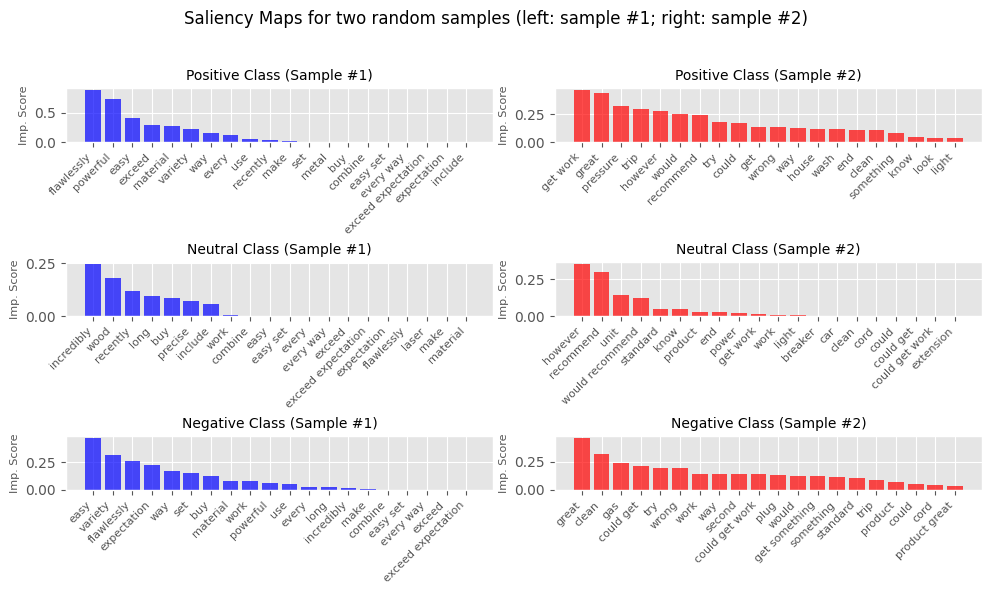

In [27]:
vectorizer = model_wrapper.vectorizer_lr
lr = model_wrapper.lr

saliency_map_1 = get_saliency_map_lr_tfidf(lr, vectorizer, [ind_df.loc[9].ind_texts])
saliency_map_2 = get_saliency_map_lr_tfidf(lr, vectorizer, [ind_df.loc[28].ind_texts])

class_names = ['Positive', 'Neutral', 'Negative']

fig, axs = plt.subplots(3, 2, figsize=(10, 6))  # Smaller figure size
fig.suptitle("Saliency Maps for two random samples (left: sample #1; right: sample #2)", fontsize=12)

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliency_map_1[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 0].bar(words_1, scores_1, color='b', alpha=0.7)
    axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size
    axs[class_idx, 0].set_title(f"{class_names[class_idx]} Class (Sample #1)", fontsize=10)
    axs[class_idx, 0].set_ylabel("Imp. Score", fontsize=8)

    # Sample 2
    words_2, scores_2 = zip(*sorted(saliency_map_2[class_idx][:20], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 1].bar(words_2, scores_2, color='r', alpha=0.7)
    axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right', fontsize=8)  # Smaller font size
    axs[class_idx, 1].set_title(f"{class_names[class_idx]} Class (Sample #2)", fontsize=10)
    axs[class_idx, 1].set_ylabel("Imp. Score", fontsize=8)

plt.tight_layout(pad=1)  # Reduced padding
plt.subplots_adjust(top=0.85)  # Adjust title position
plt.savefig(IMAGE_DIR + 'CONSISTENCY_SALIENCY_MAP_instance.png', dpi=150, bbox_inches='tight', pad_inches=0.01)  # Lower DPI and tight layout
plt.show()

<ipython-input-30-346f3b338933>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs1[class_idx].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size


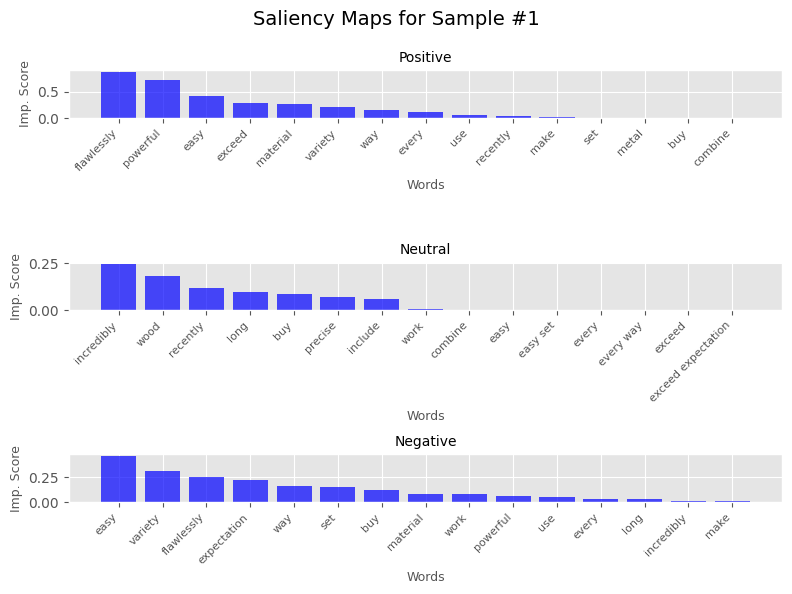

In [30]:
# two seperated plots

# Plot for Sample #1
fig1, axs1 = plt.subplots(3, 1, figsize=(8, 6))  # Smaller figure size
fig1.suptitle("Saliency Maps for Sample #1", fontsize=14)

for class_idx in range(3):
    words_1, scores_1 = zip(*sorted(saliency_map_1[class_idx][:15], key=lambda x: abs(x[1]), reverse=True))
    axs1[class_idx].bar(words_1, scores_1, color='b', alpha=0.7)
    axs1[class_idx].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size
    axs1[class_idx].set_title(f"{class_names[class_idx]}", fontsize=10)
    axs1[class_idx].set_xlabel("Words", fontsize=9)
    axs1[class_idx].set_ylabel("Imp. Score", fontsize=9)

plt.tight_layout(pad=1)  # Reduced padding
plt.subplots_adjust(top=0.88)  # Adjust title position
plt.savefig(IMAGE_DIR + 'CONSISTENCY_SALIENCY_MAP_sample1.png', bbox_inches='tight', pad_inches=0.01)  # Lower DPI
plt.show()

<ipython-input-31-a4d81c1f7977>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs1[class_idx].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size


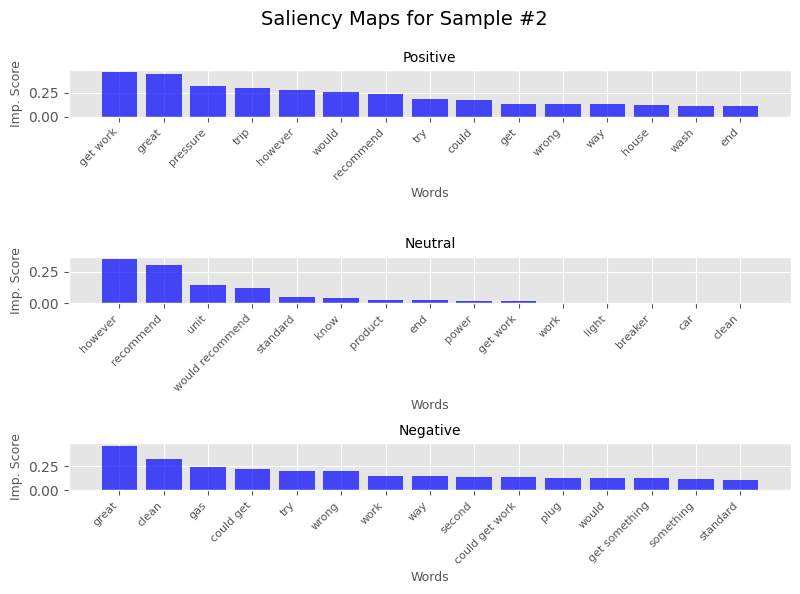

In [31]:
# two seperated plots

# Plot for Sample #2
fig1, axs1 = plt.subplots(3, 1, figsize=(8, 6))  # Smaller figure size
fig1.suptitle("Saliency Maps for Sample #2", fontsize=14)

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliency_map_2[class_idx][:15], key=lambda x: abs(x[1]), reverse=True))
    axs1[class_idx].bar(words_1, scores_1, color='b', alpha=0.7)
    axs1[class_idx].set_xticklabels(words_1, rotation=45, ha='right', fontsize=8)  # Smaller font size
    axs1[class_idx].set_title(f"{class_names[class_idx]}", fontsize=10)
    axs1[class_idx].set_xlabel("Words", fontsize=9)
    axs1[class_idx].set_ylabel("Imp. Score", fontsize=9)

plt.tight_layout(pad=1)  # Reduced padding
plt.subplots_adjust(top=0.88)  # Adjust title position
plt.savefig(IMAGE_DIR + 'CONSISTENCY_SALIENCY_MAP_sample2.png', bbox_inches='tight', pad_inches=0.01)  # Lower DPI
plt.show()

## Kendall's Tau Correlation Coefficient

In [ ]:
from scipy.stats import kendalltau

# Function to get top 50 important features using LIME
def get_important_features_lime(model, vectorizer, texts, num_features=50):
    explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])
    important_features = {}
    for text in tqdm(texts, desc="LIME"):
        exp = explainer.explain_instance(text, model_wrapper.predict_proba_lr, num_features=num_features)
        for feature, importance in exp.as_list():
            if feature in important_features:
                important_features[feature] += abs(importance)
            else:
                important_features[feature] = abs(importance)

    return sorted(important_features.items(), key=lambda x: x[1], reverse=True)[:num_features]

# Function to get top 50 important features using SHAP
def get_important_features_shap(model, vectorizer, texts, num_features=50):
    X = vectorizer.transform(texts)
    explainer = shap.LinearExplainer(model, X)
    shap_values = explainer.shap_values(X)

    feature_importance = {}
    feature_names = vectorizer.get_feature_names_out()
    for i in range(shap_values.shape[1]):
        feature_importance[feature_names[i]] = np.mean(np.abs(shap_values[:, i]))

    return sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)[:num_features]

# Function to get top 50 important features using model coefficients
def get_important_features_coefficients(model, vectorizer, num_features=50):
    feature_names = vectorizer.get_feature_names_out()
    coef_dict = {}
    for i, coef in enumerate(model.coef_[0]):
        coef_dict[feature_names[i]] = abs(coef)
    return sorted(coef_dict.items(), key=lambda x: x[1], reverse=True)[:num_features]

In [ ]:
# Function to compute Kendall's Tau Correlation Coefficient
def compute_kendall_tau(method1, method2):
    common_features = set(dict(method1).keys()) & set(dict(method2).keys())
    ranks1 = [dict(method1)[feature] for feature in common_features]
    ranks2 = [dict(method2)[feature] for feature in common_features]
    tau, p_value = kendalltau(ranks1, ranks2)
    return tau, p_value

In [ ]:
example_texts = ind_df.ind_texts
vectorizer = joblib.load(MODEL_DIR + 'lr/tfidf_vectorizer.joblib')
vectorizer.tokenizer = split_func
model = joblib.load(MODEL_DIR + 'lr/lr_best.joblib')

# Get top 50 important features for each method
lime_features = get_important_features_lime(model, vectorizer, ind_df.ind_texts)
shap_features = get_important_features_shap(model, vectorizer, ind_df.ind_texts)
coef_features = get_important_features_coefficients(model, vectorizer)

# Compute Kendall's Tau for each pair of methods
tau_lime_shap, p_lime_shap = compute_kendall_tau(lime_features, shap_features)
tau_lime_coef, p_lime_coef = compute_kendall_tau(lime_features, coef_features)
tau_shap_coef, p_shap_coef = compute_kendall_tau(shap_features, coef_features)

# Print results
print("Top 50 Important Features:")
print("LIME:", lime_features)
print("SHAP:", shap_features)
print("Model Coefficients:", coef_features)

print()
print("Kendall's Tau Correlation Coefficients:")
print(f"LIME vs SHAP: tau = {tau_lime_shap:.4f}, p-value = {p_lime_shap:.4f}")
print(f"LIME vs Model Coefficients: tau = {tau_lime_coef:.4f}, p-value = {p_lime_coef:.4f}")
print(f"SHAP vs Model Coefficients: tau = {tau_shap_coef:.4f}, p-value = {p_shap_coef:.4f}")

LIME: 100%|██████████| 63/63 [00:32<00:00,  1.93it/s]


Top 50 Important Features:
LIME: [('great', 1.2815030471802915), ('recommend', 1.0445915961709387), ('easy', 0.8146114562525474), ('pressure', 0.8078874783645105), ('work', 0.7787158368988851), ('well', 0.7089652884982861), ('would', 0.6270763037997326), ('powerful', 0.5265231173534887), ('use', 0.5182047387458709), ('however', 0.49587714741639305), ('star', 0.4855281007725873), ('suck', 0.44313846836033344), ('buy', 0.40983091139935135), ('good', 0.3962451921489875), ('long', 0.3959930190874495), ('3', 0.38904855403093763), ('get', 0.3797237711283436), ('highly', 0.3761338879306677), ('little', 0.36016949305633034), ('money', 0.3538212897823781), ('best', 0.34667374629010667), ('seem', 0.3388365030658544), ('even', 0.3344789034965685), ('try', 0.3337245239052547), ('three', 0.3316351540700031), ('clean', 0.32975489393833785), ('small', 0.3210256261577495), ('job', 0.3169196908881078), ('disappointed', 0.31314447635141596), ('price', 0.30452512642700125), ('much', 0.29122858067225144),

# Stability

In [ ]:
ind_df.head(2)

,reviewText,processedReviewText
0,"This machine comes with everything you need. Already half assembled, if you have never assembled one before, it will take you about 1 to 2 hours. If you have experience, it will take about 30 to 45 minutes. Cuts great. I didn't use candle software that comes with the machine, but the Universal G code sender I already had installed on the computer worked great. ( FYI- I do have candle already installed on my computer and it also works great with candle.) Using machine to engrave electrical alarm panels. Does a great job for what I need.",machine come everything need already half assemble never assemble one take 1 2 hour experience take 30 45 minute cut great use candle software come machine universal g code sender already instal computer work great fyi candle already instal computer also work great candle use machine engrave electrical alarm panel great job need
1,Being newer to having our own machine this is a fun and relatively easy machine to use- some kinks with software but got it sorted and works great,new machine fun relatively easy machine use kink software get sorted work great


In [ ]:
(ind_df.reviewText[6], ind_df.processedReviewText[6]), (ind_df.reviewText[13], ind_df.processedReviewText[13])

(("Terrible product, the usb controller that you have to use gave someone access to my computer and they attempted to use my IP Address. Could never get it to communicate with my computer properly and there is absolutely zero technical support. When someone finally did get back to me they said they missed it because it went into their spam folder. Have never heard that with a legit company as an excuse and. If you are a CNC pro or IT guy this might be the machine for you but I don't trust it at all.",
  'terrible product usb controller use give someone access computer attempt use ip address could never get communicate computer properly absolutely zero technical support someone finally get back say miss go spam folder never hear legit company excuse cnc pro guy might machine trust'),
 ('Laser did not work. Reached out to Amazon and to the email provided for support and received none. Horrible. Returning item is even difficult. I wish I never purchased. I guarantee this review will not g

## LIME

In [ ]:
instance_text = ind_df.loc[6].processedReviewText
explain_instance_lime(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'STABILITY_LIME_stable_instance_6_')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
instance_text = ind_df.loc[13].processedReviewText
explain_instance_lime(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'STABILITY_LIME_stable_instance_13_')

Output hidden; open in https://colab.research.google.com to view.

## SHAP

In [ ]:
print()
print()
print()
instance_text = ind_df.loc[6].processedReviewText
explain_instance_shap(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'STABILITY_SHAP_stable_instance_6_')

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [ ]:
print()
print()
print()
instance_text = ind_df.loc[13].processedReviewText
explain_instance_shap(instance=instance_text, model_wrapper=model_wrapper, save_path=IMAGE_DIR + 'STABILITY_SHAP_stable_instance_13_')

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

## Saliency Map

<ipython-input-28-ca427a33f235>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
<ipython-input-28-ca427a33f235>:38: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')


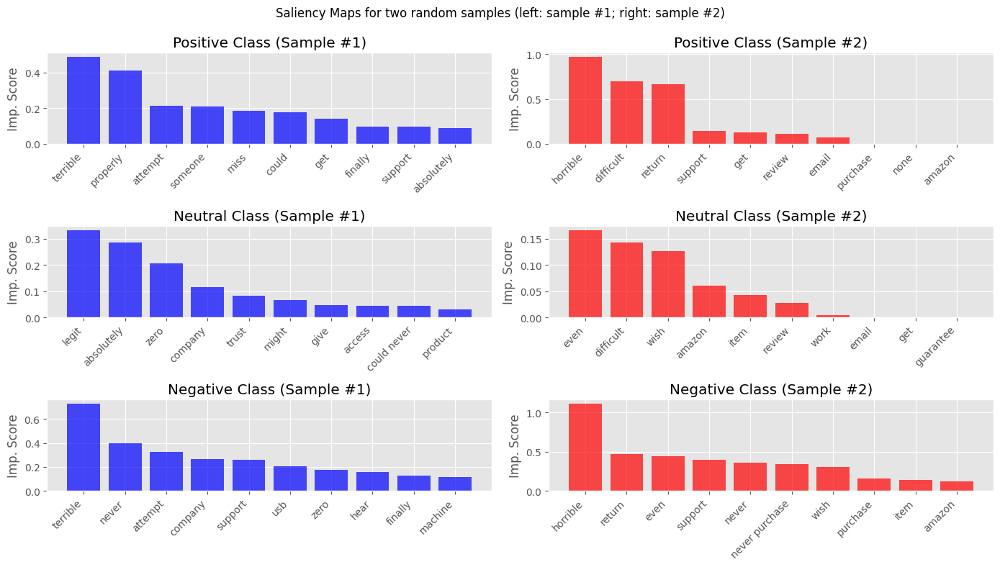

In [ ]:
vectorizer = model_wrapper.vectorizer_lr
lr = model_wrapper.lr

instance_text_1 = ind_df.loc[6].processedReviewText
instance_text_2 = ind_df.loc[13].processedReviewText

saliency_map_1 = get_saliency_map_lr_tfidf(lr, vectorizer, [instance_text_1])
saliency_map_2 = get_saliency_map_lr_tfidf(lr, vectorizer, [instance_text_2])

class_names = ['Positive', 'Neutral', 'Negative']

# Print top 10 important words for each class from both samples
# for class_idx in range(3):
#     print(f"\nTop 10 most important words for {class_names[class_idx]} class (Sample 1):")
#     for word, score in saliency_map_1[class_idx][:10]:
#         print(f"{word}: {score}")

#     print(f"\nTop 10 most important words for {class_names[class_idx]} class (Sample 2):")
#     for word, score in saliency_map_2[class_idx][:10]:
#         print(f"{word}: {score}")


fig, axs = plt.subplots(3, 2, figsize=(14, 8))
fig.suptitle("Saliency Maps for two random samples (left: sample #1; right: sample #2)")

for class_idx in range(3):
    # Sample 1
    words_1, scores_1 = zip(*sorted(saliency_map_1[class_idx][:10], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 0].bar(words_1, scores_1, color='b', alpha=0.7)
    axs[class_idx, 0].set_xticklabels(words_1, rotation=45, ha='right')
    axs[class_idx, 0].set_title(f"{class_names[class_idx]} Class (Sample #1)")
    axs[class_idx, 0].set_xlabel("")
    axs[class_idx, 0].set_ylabel("Imp. Score")

    # Sample 2
    words_2, scores_2 = zip(*sorted(saliency_map_2[class_idx][:10], key=lambda x: abs(x[1]), reverse=True))
    axs[class_idx, 1].bar(words_2, scores_2, color='r', alpha=0.7)
    axs[class_idx, 1].set_xticklabels(words_2, rotation=45, ha='right')
    axs[class_idx, 1].set_title(f"{class_names[class_idx]} Class (Sample #2)")
    axs[class_idx, 1].set_xlabel("")
    axs[class_idx, 1].set_ylabel("Imp. Score")

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig(IMAGE_DIR + 'STABILITY_SALIENCY_MAP_stable_instance.png')
plt.show()

# Stability v2

In [32]:
ind_df = pd.read_csv(DATA_DIR + 'industrial_data_v2_processed.csv')
ind_df.processedReviewText = ind_df.processedReviewText.map(lambda x: x.replace('’', '').replace('“', '').replace('”', '').strip())
ind_df

,reviewText,processedReviewText
0,"We’ve been using this CNC machine in our workshop for about a year now, and it has been fantastic. The precision it offers is unmatched, and it handles a wide variety of materials like metal and wood with ease. Even after running it for long shifts, it operates smoothly without any major hiccups. Maintenance has been minimal so far, which is a huge plus for us, as downtime can be costly. The machine’s build quality is solid, and it’s been a real asset to our production process. If you’re looking for something reliable and efficient for large-scale manufacturing, I highly recommend it.",use cnc machine workshop year fantastic precision offer unmatched handle wide variety material like metal wood ease even run long shifts operate smoothly without major hiccup maintenance minimal far huge plus u downtime costly machine build quality solid real asset production process look something reliable efficient largescale manufacturing highly recommend
1,"“Honestly, I’m really disappointed with this CNC machine. We bought it for our manufacturing line, but it’s been a headache from day one. While it’s accurate when it works, it constantly breaks down during heavy use. We’ve had to replace multiple parts already, and the machine requires constant maintenance just to keep it running. This has caused major disruptions in our production schedule. To make matters worse, customer support has been incredibly slow in responding to our requests for help. For something that’s supposed to be industrial-grade, it doesn’t hold up to the demands of our business.”",honestly really disappointed cnc machine buy manufacture line headache day one accurate work constantly break heavy use replace multiple part already machine require constant maintenance keep run cause major disruption production schedule make matter bad customer support incredibly slow respond request help something suppose industrialgrade hold demand business


In [33]:
def get_important_features_lime_single(model, vectorizer, text, num_features=15):
    pipeline = make_pipeline(vectorizer, model)
    explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])
    exp = explainer.explain_instance(text, pipeline.predict_proba, num_features=num_features)
    important_features = {}
    for feature, importance in exp.as_list():
        important_features[feature] = abs(importance)
    return sorted(important_features.items(), key=lambda x: x[1], reverse=True)[:num_features]

def get_important_features_shap_single(model, text, tokenizer=None, num_features=15):
    masker = shap.maskers.Text()
    if tokenizer:
        masker = shap.maskers.Text(tokenizer=tokenizer)
    explainer = shap.Explainer(model, masker)
    shap_values = explainer(text)
    values = np.abs(shap_values.values).sum(axis=2)[0]
    tokens = shap_values.data[0]
    important_features = {}
    for token, value in zip(tokens, values):
        important_features[token] = value
    return sorted(important_features.items(), key=lambda x: x[1], reverse=True)[:num_features]

def get_important_features_coefficients_single(model, vectorizer, text, num_features=15):
    if isinstance(text, pd.Series):
        text = text.tolist()
    feature_vector = vectorizer.transform(text).toarray()[0]
    feature_names = vectorizer.get_feature_names_out()
    coefficients = model.coef_[0]
    important_features = {
        feature_names[i]: abs(coefficients[i]) * feature_vector[i]
        for i in range(len(coefficients)) if feature_vector[i] > 0
    }
    return sorted(important_features.items(), key=lambda x: x[1], reverse=True)[:num_features]

In [34]:
vectorizer = joblib.load(MODEL_DIR + 'lr/tfidf_vectorizer.joblib')
vectorizer.tokenizer = split_func
model = joblib.load(MODEL_DIR + 'lr/lr_best.joblib')

## Most important features

In [35]:
text = ind_df.processedReviewText.iloc[0]
lime_features_single_1 = get_important_features_lime_single(model, vectorizer, text, num_features=20)
shap_features_single_1 = get_important_features_shap_single(model_wrapper.predict_proba_lr, pd.Series(text), num_features=20)
coefficients_features_single_1 = get_important_features_coefficients_single(model, vectorizer, pd.Series(text), num_features=20)

text = ind_df.processedReviewText.iloc[1]
lime_features_single_2 = get_important_features_lime_single(model, vectorizer, text, num_features=20)
shap_features_single_2 = get_important_features_shap_single(model_wrapper.predict_proba_lr, pd.Series(text), num_features=20)
coefficients_features_single_2 = get_important_features_coefficients_single(model, vectorizer, pd.Series(text), num_features=20)

In [40]:
def plot_importance(ax, model_data, title):
    features, importances = zip(*sorted(model_data, key=lambda x: x[1], reverse=True))
    ax.barh(features, importances, color='blue')
    ax.set_xlabel('Importance Score', fontsize=9)
    ax.set_title(title, fontsize=10)
    ax.invert_yaxis()

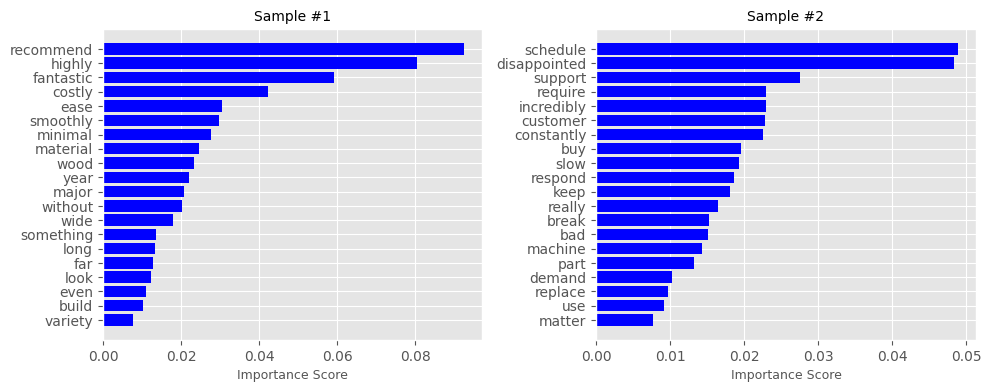

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))  # Reduced figure size
plot_importance(axs[0], lime_features_single_1, 'Sample #1')
plot_importance(axs[1], lime_features_single_2, 'Sample #2')
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_LIME_v4.png', dpi=100, bbox_inches='tight', pad_inches=0.01)
plt.show()

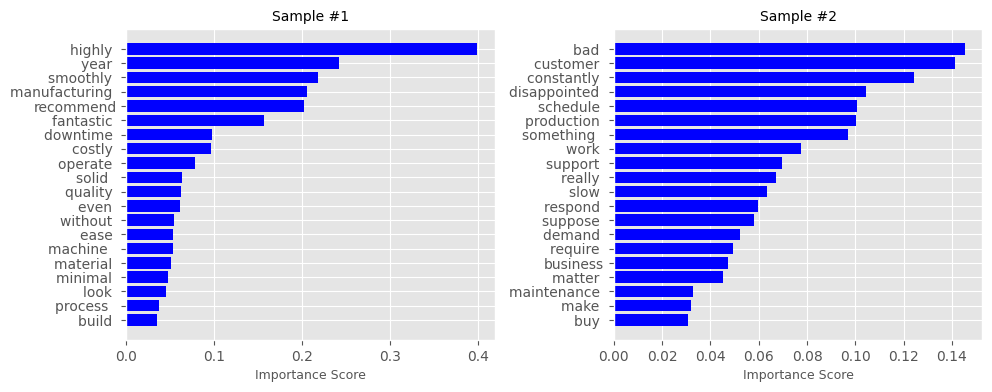

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))  # Reduced figure size
plot_importance(axs[0], shap_features_single_1, 'Sample #1')
plot_importance(axs[1], shap_features_single_2, 'Sample #2')
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_SHAP_v4.png', dpi=100, bbox_inches='tight', pad_inches=0.01)
plt.show()

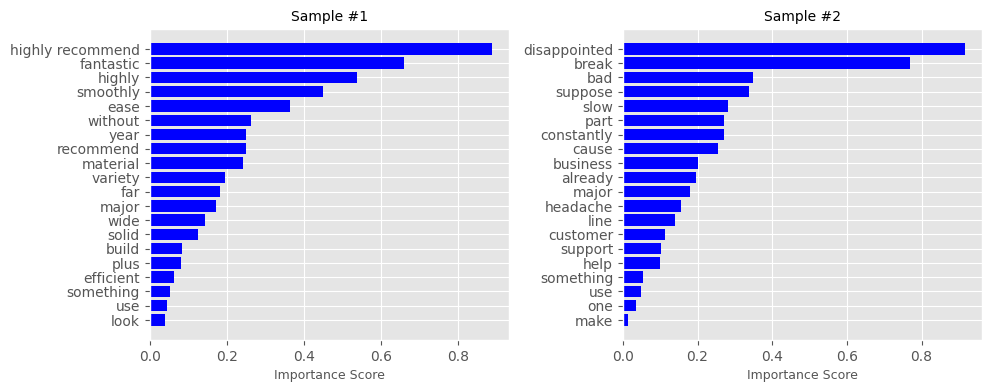

In [44]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))  # Reduced figure size
plot_importance(axs[0], coefficients_features_single_1, 'Sample #1')
plot_importance(axs[1], coefficients_features_single_2, 'Sample #2')
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_COEFF_v4.png', dpi=100, bbox_inches='tight', pad_inches=0.01)
plt.show()

In [45]:
# lime_features_single = get_important_features_lime_single(model, vectorizer, ind_df.processedReviewText.iloc[0], num_features=20)
# shap_features_single = get_important_features_shap_single(model_wrapper.predict_proba_lr, ind_df.processedReviewText.iloc[:1], num_features=20)
# coefficients_features_single = get_important_features_coefficients_single(model, vectorizer, ind_df.processedReviewText.iloc[:1], num_features=20)

# def plot_importance(ax, model_data, title):
#     features, importances = zip(*sorted(model_data, key=lambda x: x[1], reverse=True))
#     ax.barh(features, importances, color='blue')
#     ax.set_xlabel('Importance')
#     ax.set_title(title)
#     ax.invert_yaxis()

# fig, axs = plt.subplots(1, 3, figsize=(18, 6))
# plot_importance(axs[0], lime_features_single, 'LIME')
# plot_importance(axs[1], shap_features_single, 'SHAP')
# plot_importance(axs[2], coefficients_features_single, 'Saliency Map (Model Coefficients)')
# plt.tight_layout()
# plt.savefig(IMAGE_DIR + 'STABILITY_instance_2_v3', dpi=300, bbox_inches='tight')  # Change the filename and format as needed
# plt.show()

## Sentence plot

In [46]:
def _get_important_features(text):
    lime_features_single = get_important_features_lime_single(model, vectorizer, text, num_features=45)
    shap_features_single = get_important_features_shap_single(model_wrapper.predict_proba_lr, pd.Series(text), num_features=45)
    shap_features_single = [(word.strip(), score) for word, score in shap_features_single]
    coefficients_features_single = get_important_features_coefficients_single(model, vectorizer, pd.Series(text), num_features=45)
    print(len(lime_features_single), len(shap_features_single), len(coefficients_features_single))
    return lime_features_single, shap_features_single, coefficients_features_single

lime_features_single_1, shap_features_single_1, coefficients_features_single_1 = _get_important_features(ind_df.processedReviewText.iloc[0])
lime_features_single_2, shap_features_single_2, coefficients_features_single_2 = _get_important_features(ind_df.processedReviewText.iloc[1])

45 45 45
45 45 45


In [47]:
def change_value(dic, sentence):
    tokens = sentence.split()
    re = {token: 0 for token in tokens}
    for token, value in dic:
        if token in re:
            re[token] = value
    return re

lime_features_single_1 = change_value(lime_features_single_1, ind_df.processedReviewText.iloc[0])
shap_features_single_1 = change_value(shap_features_single_1, ind_df.processedReviewText.iloc[0])
coefficients_features_single_1 = change_value(coefficients_features_single_1, ind_df.processedReviewText.iloc[0])
print(len(lime_features_single_1), len(shap_features_single_1), len(coefficients_features_single_1))

lime_features_single_2 = change_value(lime_features_single_2, ind_df.processedReviewText.iloc[1])
shap_features_single_2 = change_value(shap_features_single_2, ind_df.processedReviewText.iloc[1])
coefficients_features_single_2 = change_value(coefficients_features_single_2, ind_df.processedReviewText.iloc[1])
print(len(lime_features_single_2), len(shap_features_single_2), len(coefficients_features_single_2))

49 49 49
47 47 47


In [48]:
def normalize_dict_values(dict_):
    if not dict_:
        return {}
    min_value = min(dict_.values())
    max_value = max(dict_.values())
    normalized_dict = {
        word: (value - min_value) / (max_value - min_value)
        for word, value in dict_.items()
    }
    return normalized_dict

lime_features_single_1 = normalize_dict_values(lime_features_single_1)
shap_features_single_1 = normalize_dict_values(shap_features_single_1)
coefficients_features_single_1 = normalize_dict_values(coefficients_features_single_1)

lime_features_single_2 = normalize_dict_values(lime_features_single_2)
shap_features_single_2 = normalize_dict_values(shap_features_single_2)
coefficients_features_single_2 = normalize_dict_values(coefficients_features_single_2)

In [62]:
def plot_sentence(ax, sorted_dict, max_line_width=3.5, line_spacing=0.7):
    current_line = []
    lines = []
    line_width = 0

    for word, value in sorted_dict.items():
        rect_width = len(word) * 0.045  # Slightly reduced width scaling
        if line_width + rect_width > max_line_width:
            lines.append(current_line)
            current_line = []
            line_width = 0
        current_line.append((word, value, rect_width))
        line_width += rect_width + 0.015  # Reduced spacing between words

    if current_line:
        lines.append(current_line)

    y = 0
    for line in lines:
        total_line_width = sum(rect_width for _, _, rect_width in line) + (len(line) - 1) * 0.015
        x = -total_line_width / 2
        for word, value, rect_width in line:
            rect_height = 0.4  # Reduced rectangle height

            color = plt.cm.Blues(value)
            ax.add_patch(plt.Rectangle((x, y - rect_height / 2), rect_width, rect_height,
                                          color=color, alpha=0.85))  # Adjusted alpha for less opacity
            ax.text(x + rect_width / 2, y, word, fontsize=10, ha='center', va='center', color='black')  # Smaller font size
            x += rect_width + 0.015
        y -= line_spacing

    ax.set_xlim(-max_line_width / 2 - 0.1, max_line_width / 2 + 0.1)
    ax.set_ylim(y + 0.3, 0.3)
    ax.axis('off')

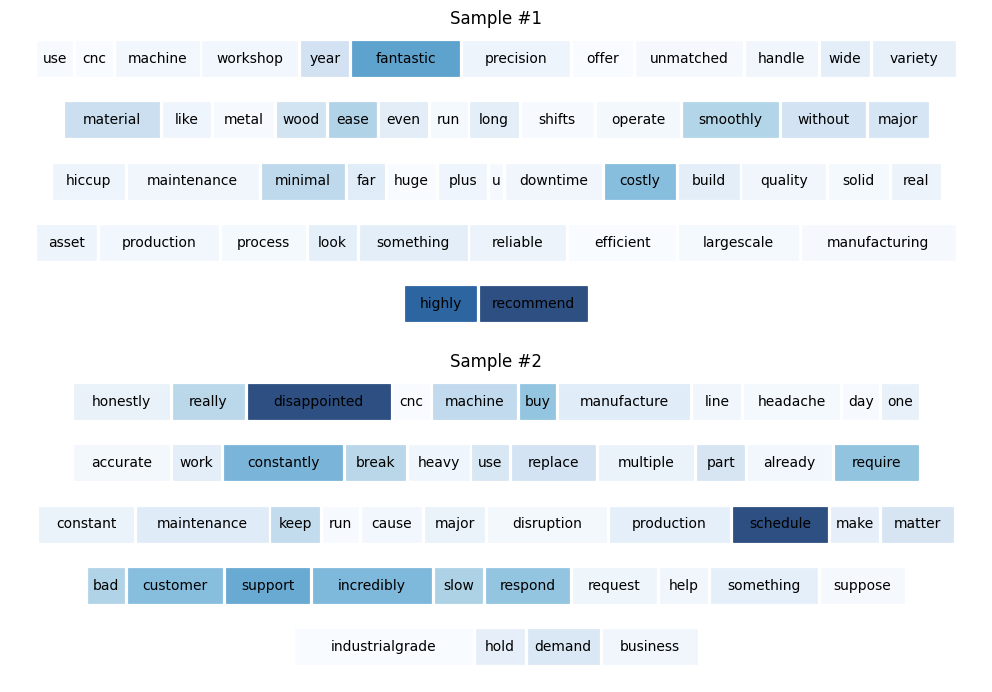

In [65]:
fig, axes = plt.subplots(2, 1, figsize=(10, 7))
plot_sentence(axes[0], lime_features_single_1)
axes[0].set_title("Sample #1", fontsize=12)
plot_sentence(axes[1], lime_features_single_2)
axes[1].set_title("Sample #2", fontsize=12)
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_LIME_sentence_plot_v4.png', dpi=50, bbox_inches='tight', pad_inches=0.01)
plt.show()

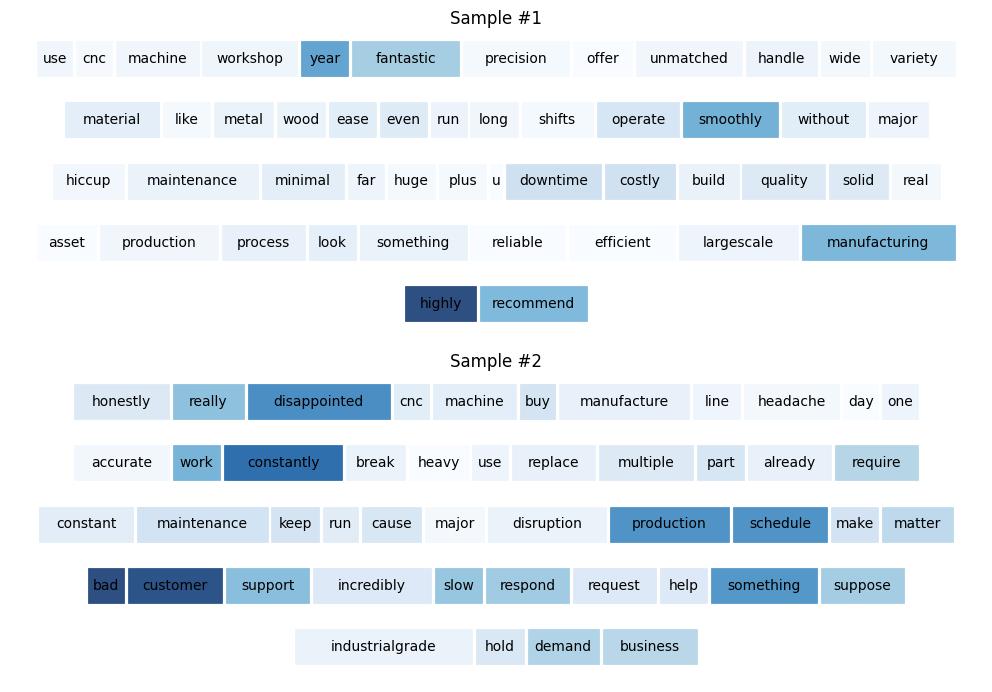

In [66]:
fig, axes = plt.subplots(2, 1, figsize=(10, 7))
plot_sentence(axes[0], shap_features_single_1)
axes[0].set_title("Sample #1", fontsize=12)
plot_sentence(axes[1], shap_features_single_2)
axes[1].set_title("Sample #2", fontsize=12)
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_SHAP_sentence_plot_v4.png', dpi=50, bbox_inches='tight', pad_inches=0.01)
plt.show()

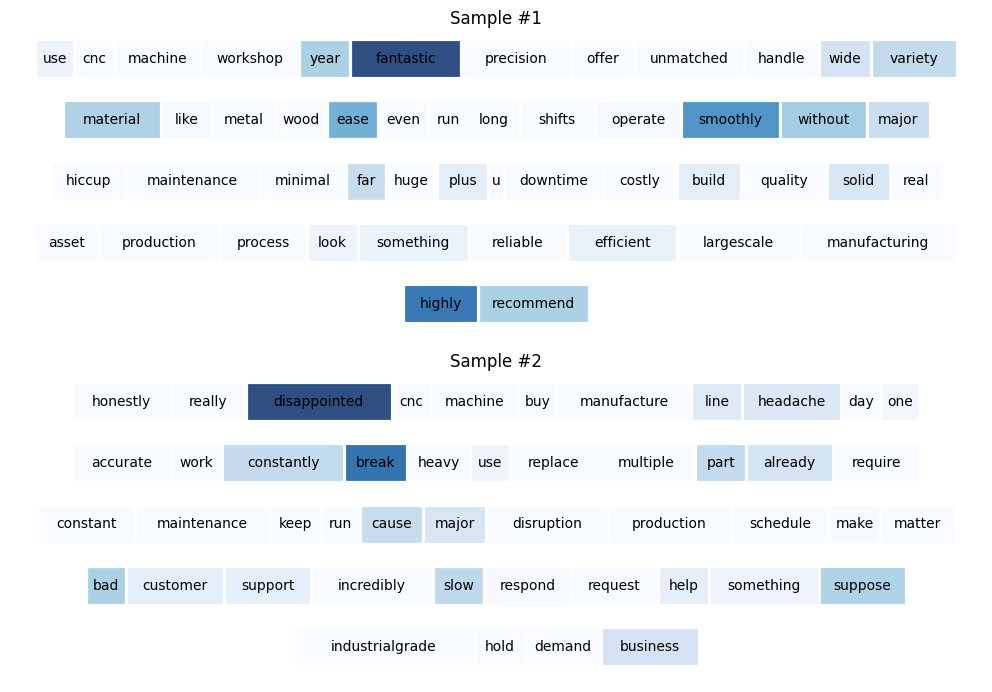

In [67]:
fig, axes = plt.subplots(2, 1, figsize=(10, 7))
plot_sentence(axes[0], coefficients_features_single_1)
axes[0].set_title("Sample #1", fontsize=12)
plot_sentence(axes[1], coefficients_features_single_2)
axes[1].set_title("Sample #2", fontsize=12)
plt.tight_layout(pad=1)
plt.savefig(IMAGE_DIR + 'STABILITY_COEFF_sentence_plot_v4.png', dpi=50, bbox_inches='tight', pad_inches=0.01)
plt.show()